In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

#import numpy as np # linear algebra
#import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

#import os
#for dirname, _, filenames in os.walk('/kaggle/input'):
 #   for filename in filenames:
  #      print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")
import os
import glob as gb
import cv2
import tensorflow as tf
import keras

In [3]:
trainpath = '../input/intel-image-classification/seg_train/'
testpath = '../input/intel-image-classification/seg_test/'
predpath = '../input/intel-image-classification/seg_pred/'

In [4]:
for folder in os.listdir(trainpath+'seg_train'):
    files = gb.glob(pathname=str(trainpath+'seg_train//'+folder+'/*.jpg'))
    print(f'For training data , found {len(files)} in folder {folder}')


For training data , found 2512 in folder mountain
For training data , found 2382 in folder street
For training data , found 2191 in folder buildings
For training data , found 2274 in folder sea
For training data , found 2271 in folder forest
For training data , found 2404 in folder glacier


In [5]:
for folder in os.listdir(testpath+'seg_test'):
    files = gb.glob(pathname=str(testpath+'seg_test//'+folder+'/*.jpg'))
    print(f'For testing data , found {len(files)} in folder {folder}')


For testing data , found 525 in folder mountain
For testing data , found 501 in folder street
For testing data , found 437 in folder buildings
For testing data , found 510 in folder sea
For testing data , found 474 in folder forest
For testing data , found 553 in folder glacier


In [6]:
files = gb.glob(pathname= str(predpath +'seg_pred/*.jpg'))
print(f'For Prediction data , found {len(files)}')

For Prediction data , found 7301


In [7]:
code = {'buildings':0 ,'forest':1,'glacier':2,'mountain':3,'sea':4,'street':5}

def getcode(n) : 
    for x , y in code.items() : 
        if n == y : 
            return x

In [8]:
size = []
for folder in  os.listdir(trainpath +'seg_train') : 
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    13986
(113, 150, 3)        7
(135, 150, 3)        3
(111, 150, 3)        3
(136, 150, 3)        2
(134, 150, 3)        2
(108, 150, 3)        2
(143, 150, 3)        2
(142, 150, 3)        2
(144, 150, 3)        2
(123, 150, 3)        2
(146, 150, 3)        2
(115, 150, 3)        1
(124, 150, 3)        1
(81, 150, 3)         1
(145, 150, 3)        1
(103, 150, 3)        1
(102, 150, 3)        1
(147, 150, 3)        1
(97, 150, 3)         1
(120, 150, 3)        1
(110, 150, 3)        1
(76, 150, 3)         1
(119, 150, 3)        1
(141, 150, 3)        1
(140, 150, 3)        1
(149, 150, 3)        1
(131, 150, 3)        1
(100, 150, 3)        1
(133, 150, 3)        1
(105, 150, 3)        1
dtype: int64

In [9]:
size = []
for folder in  os.listdir(testpath +'seg_test') : 
    files = gb.glob(pathname= str( testpath +'seg_test//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    2993
(131, 150, 3)       1
(149, 150, 3)       1
(81, 150, 3)        1
(141, 150, 3)       1
(76, 150, 3)        1
(110, 150, 3)       1
(72, 150, 3)        1
dtype: int64

In [10]:
size = []
files = gb.glob(pathname= str( predpath +'seg_pred/*.jpg'))
for file in files: 
    image = plt.imread(file)
    size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    7288
(131, 150, 3)       1
(149, 150, 3)       1
(143, 150, 3)       1
(126, 150, 3)       1
(108, 150, 3)       1
(144, 150, 3)       1
(374, 500, 3)       1
(129, 150, 3)       1
(112, 150, 3)       1
(139, 150, 3)       1
(133, 150, 3)       1
(124, 150, 3)       1
(100, 150, 3)       1
dtype: int64

In [11]:
s=150

In [12]:
X_train = []
y_train = []
for folder in  os.listdir(trainpath +'seg_train') : 
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_train.append(list(image_array))
        y_train.append(code[folder])

In [13]:
print (f'{len(X_train)} img in training data')

14034 img in training data


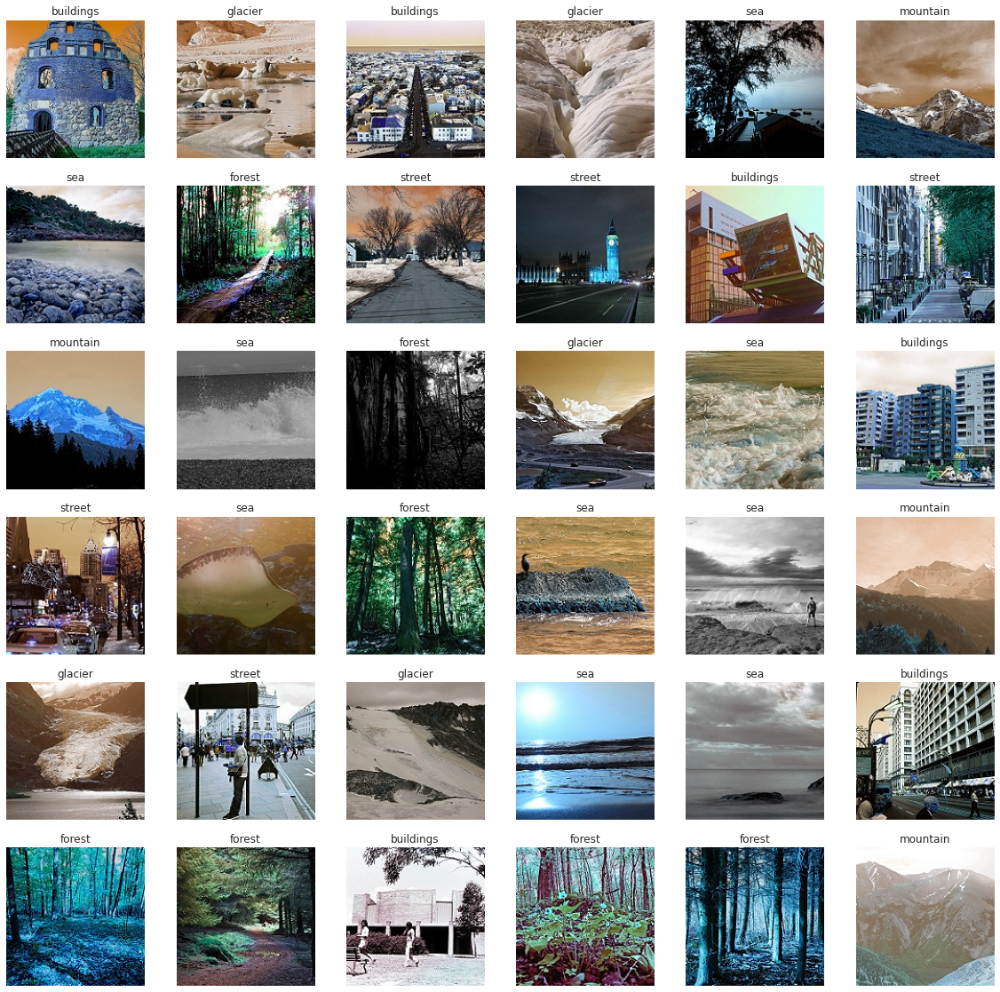

In [14]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_train),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])   
    plt.axis('off')
    plt.title(getcode(y_train[i]))

In [15]:

X_test = []
y_test = []
for folder in  os.listdir(testpath +'seg_test') : 
    files = gb.glob(pathname= str(testpath + 'seg_test//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_test.append(list(image_array))
        y_test.append(code[folder])

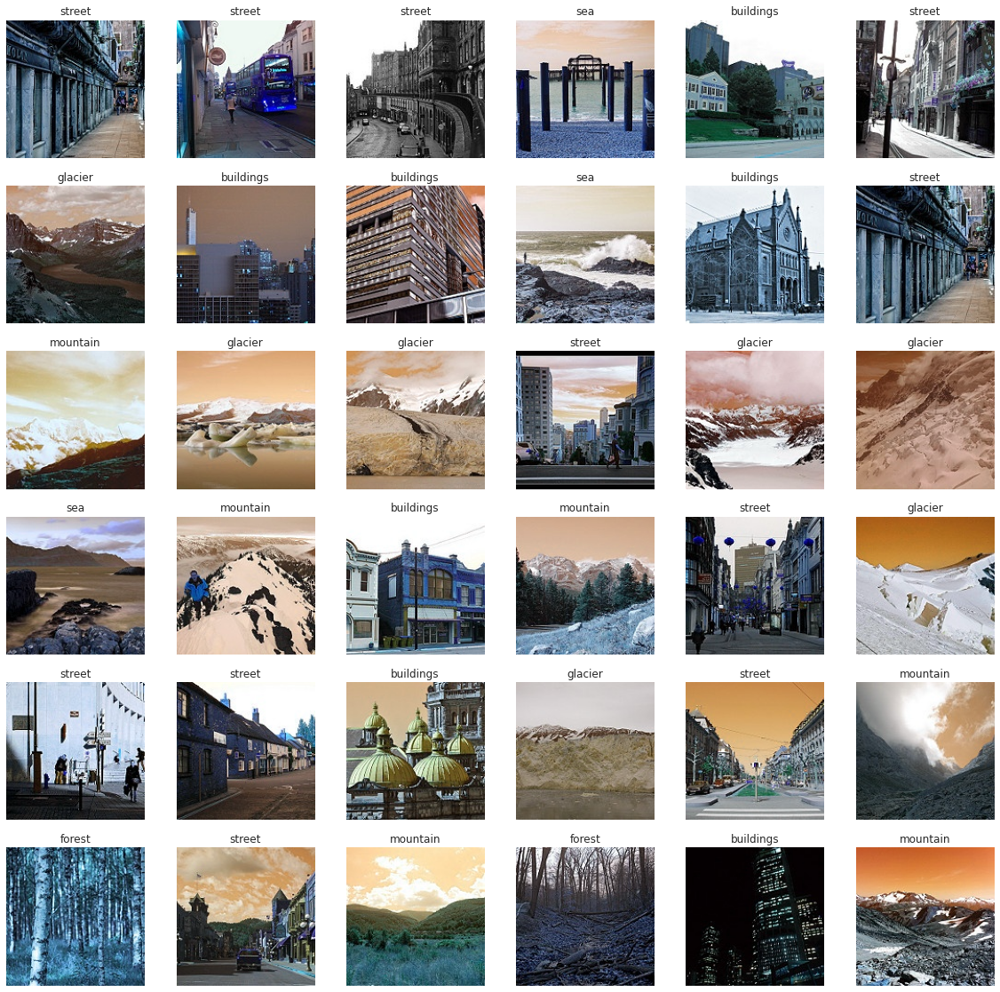

In [16]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_test),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])    
    plt.axis('off')
    plt.title(getcode(y_test[i]))

In [17]:
X_pred = []
files = gb.glob(pathname= str(predpath + 'seg_pred/*.jpg'))
for file in files: 
    image = cv2.imread(file)
    image_array = cv2.resize(image , (s,s))
    X_pred.append(list(image_array))

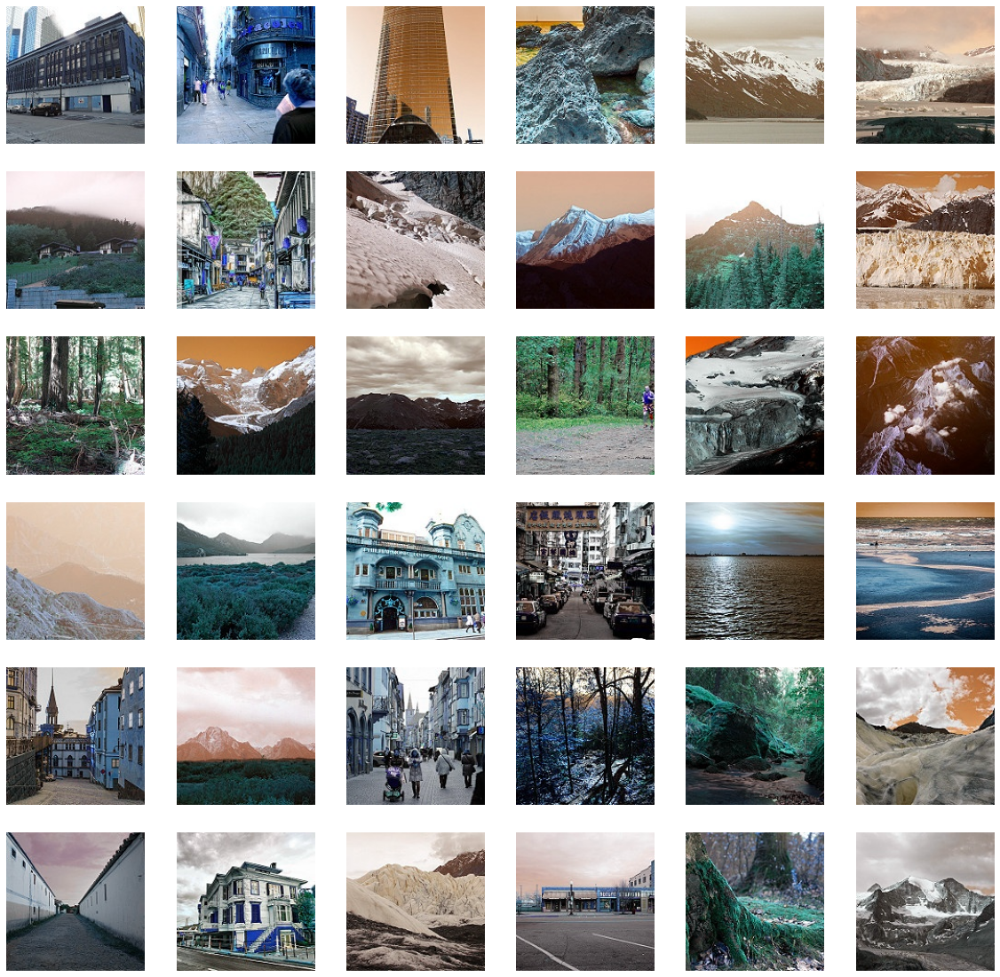

In [18]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')

In [19]:
X_train = np.array(X_train)
X_test = np.array(X_test)
X_pred_array = np.array(X_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'X_pred shape  is {X_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (14034, 150, 150, 3)
X_test shape  is (3000, 150, 150, 3)
X_pred shape  is (7301, 150, 150, 3)
y_train shape  is (14034,)
y_test shape  is (3000,)


In [20]:
KerasModel = keras.models.Sequential([
        keras.layers.Conv2D(200,kernel_size=(3,3),activation='relu',input_shape=(s,s,3)),
        keras.layers.MaxPool2D(3,3),
        keras.layers.Conv2D(120,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(2,2),
        keras.layers.Conv2D(120,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(2,2),
        keras.layers.Conv2D(80,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(50,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        tf.keras.layers.BatchNormalization(),
        keras.layers.Flatten() ,    
        keras.layers.Dropout(rate=0.2),
        keras.layers.Dense(120,activation='relu') ,    
        keras.layers.Dense(100,activation='relu') ,    
        keras.layers.Dense(50,activation='relu') ,                    
        keras.layers.Dense(6,activation='softmax') ,    
        ])

In [21]:
KerasModel.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [22]:
print('Model Details are : ')
print(KerasModel.summary())

Model Details are : 
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 148, 148, 200)     5600      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 49, 49, 200)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 47, 47, 120)       216120    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 23, 23, 120)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 21, 21, 120)       129720    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 10, 10, 120)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None,

In [23]:

epochs = 25
ThisModel = KerasModel.fit(X_train, y_train, epochs=epochs,batch_size=64)

Epoch 1/25
220/220 [==============================] - 1100s 5s/step - loss: 1.3388 - accuracy: 0.4492
Epoch 2/25
220/220 [==============================] - 1094s 5s/step - loss: 0.9076 - accuracy: 0.6418
Epoch 3/25
220/220 [==============================] - 1111s 5s/step - loss: 0.7754 - accuracy: 0.7018
Epoch 4/25
220/220 [==============================] - 1104s 5s/step - loss: 0.7162 - accuracy: 0.7323
Epoch 5/25
220/220 [==============================] - 1130s 5s/step - loss: 0.6632 - accuracy: 0.7546
Epoch 6/25
220/220 [==============================] - 1126s 5s/step - loss: 0.6173 - accuracy: 0.7706
Epoch 7/25
220/220 [==============================] - 1152s 5s/step - loss: 0.5700 - accuracy: 0.7813
Epoch 8/25
220/220 [==============================] - 1131s 5s/step - loss: 0.5673 - accuracy: 0.7939
Epoch 9/25
220/220 [==============================] - 1105s 5s/step - loss: 0.6266 - accuracy: 0.7638
Epoch 10/25
220/220 [==============================] - 1133s 5s/step - loss: 0.517

In [24]:
ModelLoss, ModelAccuracy = KerasModel.evaluate(X_test, y_test)

print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

94/94 [==============================] - 60s 639ms/step - loss: 0.6373 - accuracy: 0.8083
Test Loss is 0.6373381614685059
Test Accuracy is 0.8083333373069763


In [25]:
y_result = KerasModel.predict(X_pred_array)

print('Prediction Shape is {}'.format(y_result.shape))

Prediction Shape is (7301, 6)


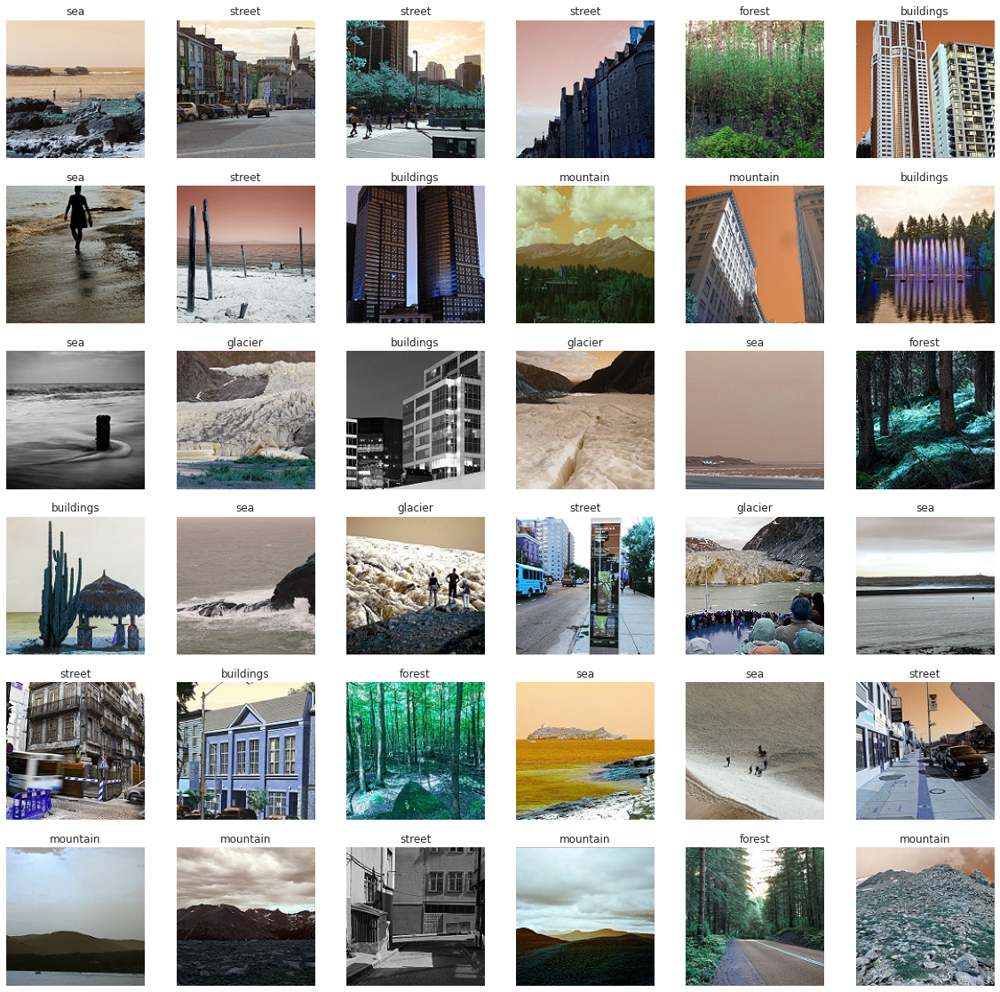

In [26]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(y_result[i])))